## Case Study of Lending Loan to identify tendency of Loan Defaulters


#### Step 0 -> Importing Libraries and Reading Data

In [1]:
## Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.options.display.max_seq_items = 300

#### Libraries Used: numpy, pandas, matplotlib, seaborn, warnings

In [2]:
#Reading the Data
df = pd.read_csv("loan.csv")

## Step 1 -> Data Understanding

In [7]:
df.shape

(39717, 111)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [321]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [11]:
#pd.options.display.max_columns = 3000
#pd.options.display.max_seq_items = 300
df.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'policy_code', 'application_type',
       'annual_inc_joint', 'dti_joint', 'verification_status_joint',
    

## Step 2 -> Data Preparation

- Fix rows and columns
- Missing Values
- Standardise Numbers
- Standardise Text
- Fix Invalid Values
- Filter Data


In [13]:
df.isnull().sum()

id                                    0
member_id                             0
loan_amnt                             0
funded_amnt                           0
funded_amnt_inv                       0
term                                  0
int_rate                              0
installment                           0
grade                                 0
sub_grade                             0
emp_title                          2459
emp_length                         1075
home_ownership                        0
annual_inc                            0
verification_status                   0
issue_d                               0
loan_status                           0
pymnt_plan                            0
url                                   0
desc                              12942
purpose                               0
title                                11
zip_code                              0
addr_state                            0
dti                                   0


In [15]:
df1 = df.dropna(axis = 1, how = 'all')
df1.shape

(39717, 57)

Observation : Dropped all columns having null values , the coulmn count is down to 57 from 111

In [17]:
df1.isnull().sum().sort_values(ascending=False)

next_pymnt_d                  38577
mths_since_last_record        36931
mths_since_last_delinq        25682
desc                          12942
emp_title                      2459
emp_length                     1075
pub_rec_bankruptcies            697
last_pymnt_d                     71
chargeoff_within_12_mths         56
collections_12_mths_ex_med       56
revol_util                       50
tax_liens                        39
title                            11
last_credit_pull_d                2
home_ownership                    0
int_rate                          0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
term                              0
last_pymnt_amnt                   0
initial_list_status               0
funded_amnt_inv             

In [21]:
df1.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_

In [ ]:
# dropping columns with very low cardinatity , having 1 unique value and null values
#df1.drop(['url','pymnt_plan','url','policy_code','annual_inc_joint','acc_now_delinq','delinq_amnt','tax_liens','chargeoff_within_12_mths','collections_12_mths_ex_med','initial_list_status'],axis = 1, inplace = True)
# Dropping zip_code due to masked values and not useful as input for the analysis
df1.drop(['zip_code'],axis=1, inplace = True)
# Dropping desc,emp_title,##desc as they have no significance to the analysis as they are random varaibles and hold infomration which might not have significance to the conclusions
df1.drop(['emp_title','title'],axis=1,inplace = True)
# dropping member_id as it not useful for analysis and is a duplicate index column
df1.drop(['member_id'],axis=1, inplace = True)
## These columns dropped are customer behaviour calculated variables and will not useful as input for the analysis
df1.drop(['total_acc','out_prncp','out_prncp_inv','total_pymnt','open_acc','pub_rec','revol_bal','revol_util','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','application_type','delinq_2yrs','earliest_cr_line','inq_last_6mths'],axis = 1, inplace = True)
df1.drop(['url','pymnt_plan','url','policy_code','acc_now_delinq','delinq_amnt','tax_liens','chargeoff_within_12_mths','collections_12_mths_ex_med','initial_list_status'],axis = 1, inplace = True)
# dropping funded_amnt_inv as it is a internal data and is calculated after loan approval thus cannot be used as input for the analysis
df1.drop(['funded_amnt_inv'],axis=1,inplace = True)
df1.drop(['mths_since_last_delinq','mths_since_last_record','next_pymnt_d'],axis=1,inplace = True)
df1.shape

In [30]:
df1.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'desc', 'purpose',
       'addr_state', 'dti', 'pub_rec_bankruptcies'],
      dtype='object')

In [60]:
#df1.drop(['installment','issue_d'],axis=1, inplace = True)
df1.drop(['desc'],axis=1, inplace = True)
#df1.shape
df1.shape

(38642, 18)

In [62]:
# Checking columns for irrelevant data which has no impact to analysis(having very few unqiue values)
df1.nunique().sort_values(ascending=True)

term                        2
pub_rec_bankruptcies        3
loan_status                 3
verification_status         3
home_ownership              5
grade                       7
emp_length                 11
purpose                    14
sub_grade                  35
addr_state                 50
issue_d                    55
int_rate                  371
loan_amnt                 880
funded_amnt              1038
dti                      2863
annual_inc               5100
installment             15149
id                      38642
dtype: int64

we are now done with removing irrelevant columns , we now have the dataset for analysis and will now move ahead to fix the values inside rows haivng null values as per their relevance

In [64]:
df1.isnull().sum().sort_values(ascending=False)

id                      0
loan_amnt               0
dti                     0
addr_state              0
purpose                 0
loan_status             0
issue_d                 0
verification_status     0
annual_inc              0
home_ownership          0
emp_length              0
sub_grade               0
grade                   0
installment             0
int_rate                0
term                    0
funded_amnt             0
pub_rec_bankruptcies    0
dtype: int64

The above columns has null values which can be removed or fixed depending on the relevance of the column to objective of the analysis

In [66]:
df1.pub_rec_bankruptcies.value_counts()

pub_rec_bankruptcies
0.0    37072
1.0     1563
2.0        7
Name: count, dtype: int64

In [68]:
df1.emp_length.value_counts()

emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: count, dtype: int64

In [70]:
df1.pub_rec_bankruptcies.fillna(0,inplace=True)

In [72]:
df1.pub_rec_bankruptcies.value_counts()

pub_rec_bankruptcies
0.0    37072
1.0     1563
2.0        7
Name: count, dtype: int64

In [74]:
# Removing null values in emp_title and emp_length columns
df1.dropna(subset=['emp_length'])
# Shape of the dataframe after removing columns
df1.shape

(38642, 18)

In [76]:
df1.isnull().sum()

id                      0
loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64

In [78]:
df1 = df1.dropna(subset=['emp_length'])

In [80]:
df1.isnull().sum()

id                      0
loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
addr_state              0
dti                     0
pub_rec_bankruptcies    0
dtype: int64

In [82]:
df1.shape

(38642, 18)

In [84]:
df1.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'pub_rec_bankruptcies'],
      dtype='object')

In [86]:
# Removing duplicate rows in the dataframe
df1.drop_duplicates()
# Shape of the dataframe after removing duplicate rows
df1.shape
# No duplicate rows found in the dataframe

(38642, 18)

In [88]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38642 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    38642 non-null  int64  
 1   loan_amnt             38642 non-null  int64  
 2   funded_amnt           38642 non-null  int64  
 3   term                  38642 non-null  object 
 4   int_rate              38642 non-null  object 
 5   installment           38642 non-null  float64
 6   grade                 38642 non-null  object 
 7   sub_grade             38642 non-null  object 
 8   emp_length            38642 non-null  object 
 9   home_ownership        38642 non-null  object 
 10  annual_inc            38642 non-null  float64
 11  verification_status   38642 non-null  object 
 12  issue_d               38642 non-null  object 
 13  loan_status           38642 non-null  object 
 14  purpose               38642 non-null  object 
 15  addr_state            38

In [90]:
df1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies
0,1077501,5000,5000,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,AZ,27.65,0.0
1,1077430,2500,2500,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,GA,1.00,0.0
2,1077175,2400,2400,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,IL,8.72,0.0
3,1076863,10000,10000,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,CA,20.00,0.0
4,1075358,3000,3000,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Dec-11,Current,other,OR,17.94,0.0


In [92]:
df1.emp_length=df1.emp_length.apply(lambda x: x.replace('+','').replace('years','').replace('< 1','0.5').replace('year','')).astype(float)
#df1.emp_length=df1.emp_length.apply(lambda x: x.replace('years','').replace('+','').replace('< 1','0.5').replace('year','')).astype(float)
#df1.emp_length=df1.emp_length.apply(lambda x: x.replace('years','').replace('+','').replace('< 1','0.5').replace('year','')).astype(float)
df1.term=df1.term.apply(lambda x: int(x.replace(' months',''))).astype(int)
df1.int_rate=df1.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
df1.grade=df1.grade.astype('category')
df1.sub_grade=df1.sub_grade.astype('category')
df1.home_ownership=df1.home_ownership.astype('category')
df1.verification_status=df1.verification_status.astype('category')
df1.issue_d=pd.to_datetime(df1.issue_d,format='%b-%y')
df1['issue_year']=pd.to_datetime(df1.issue_d,format='%b-%y').dt.year
df1['issue_month']=pd.to_datetime(df1.issue_d,format='%b-%y').dt.month#
df1.loan_status=df1.loan_status.apply(lambda x: x.replace('Fully Paid','0').replace('Charged Off','1').replace('Current','2')).astype('int')
df1.purpose=df1.purpose.astype('category')
df1.addr_state=df1.addr_state.astype('category')

In [94]:
# Setting decimal point limit for all data 
for x in df1.columns:
    if(df1[x].dtype=='float64'):
      df1[x]=df1[x].round(2)
df1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,pub_rec_bankruptcies,issue_year,issue_month
0,1077501,5000,5000,36,10.65,162.87,B,B2,10.0,RENT,24000.0,Verified,2011-12-01,0,credit_card,AZ,27.65,0.0,2011,12
1,1077430,2500,2500,60,15.27,59.83,C,C4,0.5,RENT,30000.0,Source Verified,2011-12-01,1,car,GA,1.00,0.0,2011,12
2,1077175,2400,2400,36,15.96,84.33,C,C5,10.0,RENT,12252.0,Not Verified,2011-12-01,0,small_business,IL,8.72,0.0,2011,12
3,1076863,10000,10000,36,13.49,339.31,C,C1,10.0,RENT,49200.0,Source Verified,2011-12-01,0,other,CA,20.00,0.0,2011,12
4,1075358,3000,3000,60,12.69,67.79,B,B5,1.0,RENT,80000.0,Source Verified,2011-12-01,2,other,OR,17.94,0.0,2011,12


In [96]:
df1.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'dti', 'pub_rec_bankruptcies', 'issue_year',
       'issue_month'],
      dtype='object')

In [104]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38642 entries, 0 to 39716
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    38642 non-null  int64         
 1   loan_amnt             38642 non-null  int64         
 2   funded_amnt           38642 non-null  int64         
 3   term                  38642 non-null  int32         
 4   int_rate              38642 non-null  float64       
 5   installment           38642 non-null  float64       
 6   grade                 38642 non-null  category      
 7   sub_grade             38642 non-null  category      
 8   emp_length            38642 non-null  float64       
 9   home_ownership        38642 non-null  category      
 10  annual_inc            38642 non-null  float64       
 11  verification_status   38642 non-null  category      
 12  issue_d               38642 non-null  datetime64[ns]
 13  loan_status          

In [106]:
df1 = df1[df1.loan_status!='Current']

In [108]:
df1.shape

(38642, 20)

In [110]:
# selecting columns based on domain knowledge
## Id, Loan Amount, Term of loan, Interest Rate, Grade, Sub Grade, Emp Length, Home Ownership, Verification Status, Annual Income, Loan Status,Purpose of Loan, State provided by burrower, DTI ratio, Number of public record bankruptcies and derived columns of Issue month and year
df1 = df1[['id','loan_amnt','term','int_rate','grade','sub_grade','emp_length','home_ownership','verification_status','annual_inc','loan_status','purpose','addr_state','dti','pub_rec_bankruptcies','issue_year','issue_month']]
# Shape of the dataframe after removing columns
df1.shape

(38642, 17)

In [112]:
# Divding the column as per categorical and numerical
category_cols = ['term','grade','sub_grade','emp_length','home_ownership','verification_status','purpose','addr_state']
continuous_cols=['loan_amnt','int_rate','annual_inc','dti','pub_rec_bankruptcies','issue_year','issue_month']
id_cols=['id']
result_cols=['loan_status']

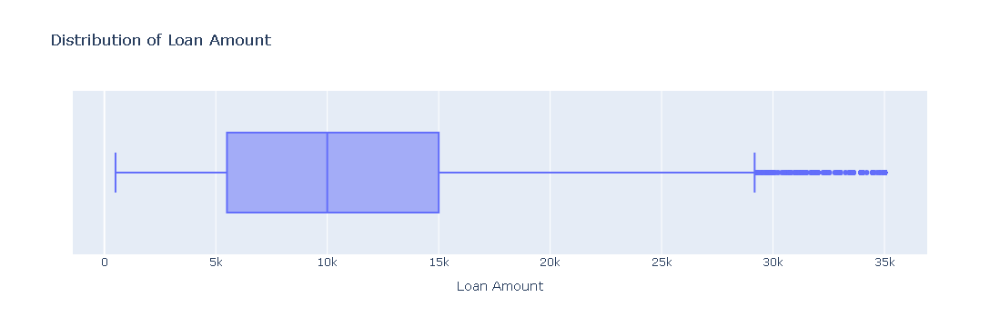

In [114]:
px.box(df1 ,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()

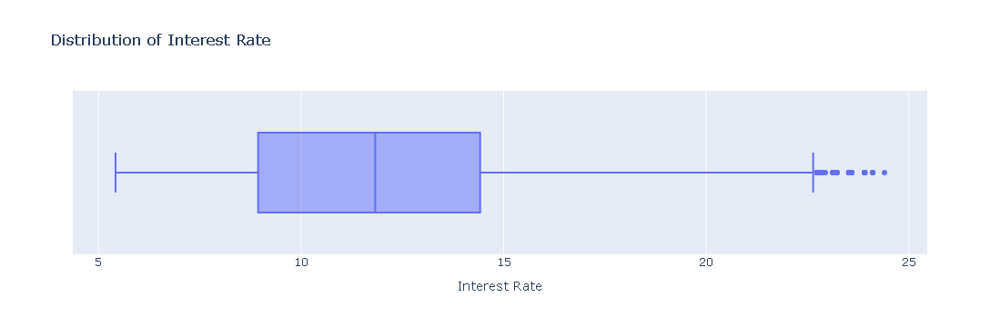

In [223]:
## starting with int_rate
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(df1,x='int_rate',width=750,height=350,title='Distribution of Interest Rate',labels={'int_rate':'Interest Rate'}).show()
## Upper fence turns out to be 22.74 whereas max is 24.4 which is not much more then upper fence thus will not have much impact on the analysis.

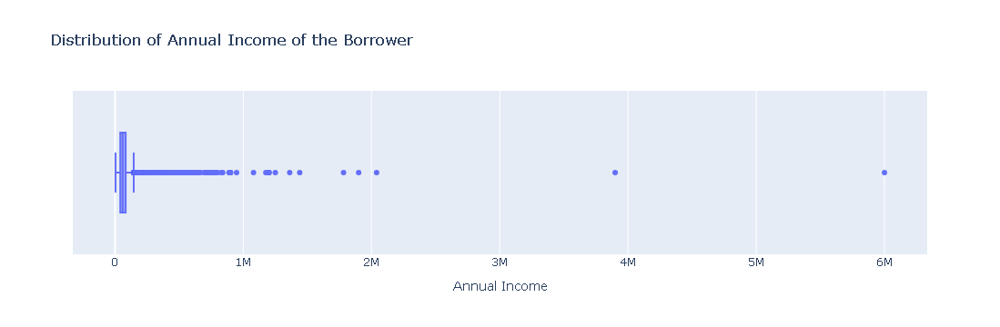

In [116]:
## starting with annual_inc
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(df1,x='annual_inc',width=750,height=350,title='Distribution of Annual Income of the Borrower',labels={'annual_inc':'Annual Income'}).show()
## Upper fence turns out to be 146k whereas max is 6000k which is much from upper fence thus we will remove the outliers in column annual_inc.

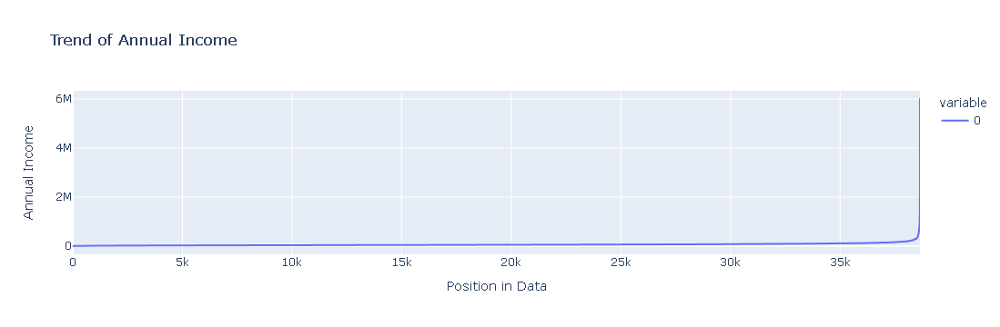

In [118]:
px.line(sorted(df1.annual_inc),width=750,height=350,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

In [120]:
## Removing outliers in annual_inc greater than 99th percentile
df1 = df1[df1.annual_inc<=np.percentile(df1.annual_inc,99)]

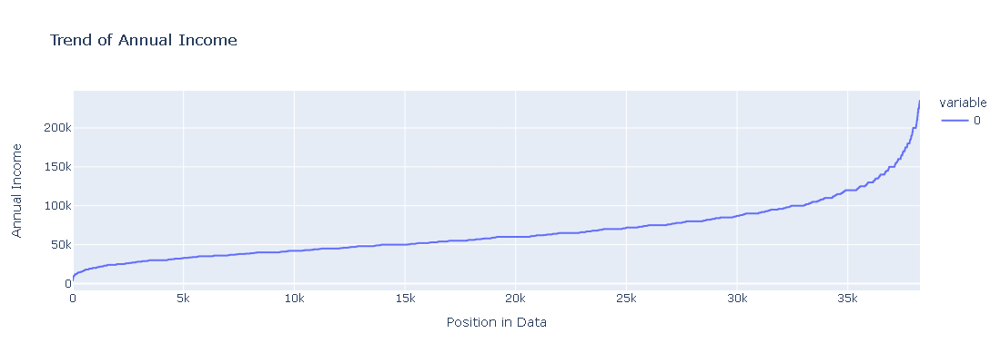

In [122]:
## checking trend of values in annual_inc using line chart to find the appropriate quantile to use to remove outliers
px.line(sorted(df1.annual_inc),width=700,height=400,title='Trend of Annual Income',labels={'value':'Annual Income','index':'Position in Data'}).show()

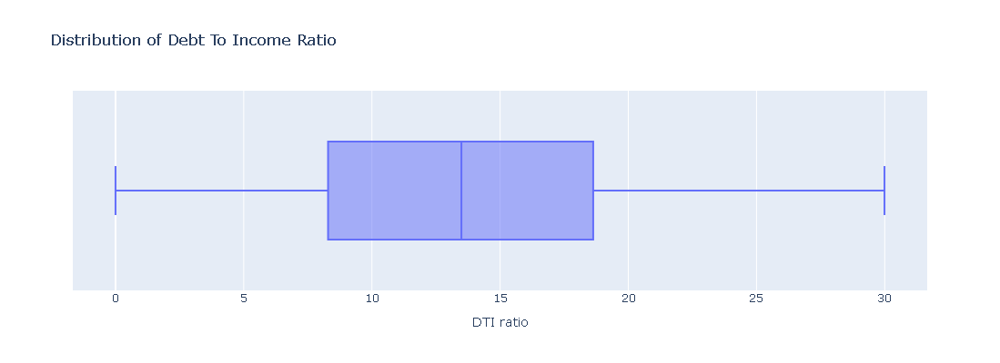

In [124]:
## starting with dti
## using plotly for interactive interaction and value retrival from chart for upper fence.
px.box(df1,x='dti',width=700,height=400,title='Distribution of Debt To Income Ratio',labels={'dti':'DTI ratio'}).show()
## There are no outliers in dti hence we can move ahead with analysis.

loan_status
0    83.156024
1    14.010508
2     2.833468
Name: count, dtype: float64


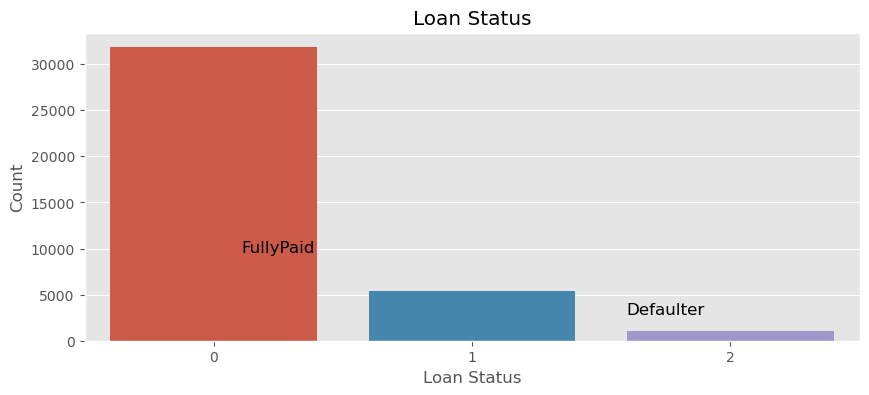

In [136]:
# Loan status 
print(df1.loan_status.value_counts()*100/df1.loan_status.count())
# 0=Fully Paid, 1=Charged Off
plt.figure(figsize=(10,4))
#ax=sns.countplot(df1.loan_status)
ax = sns.countplot(x='loan_status', data=df1)
ax.annotate('FullyPaid',xy=(0.25,0.3),xycoords='axes fraction',horizontalalignment='center',verticalalignment='center',fontsize=12)
ax.annotate('Defaulter',xy=(0.75,0.1),xycoords='axes fraction',horizontalalignment='center',verticalalignment='center',fontsize=12)
ax.set_title('Loan Status')
ax.set_xlabel('Loan Status')
ax.set_ylabel('Count')
plt.show()

count    38257.000000
mean     11206.245262
std       7381.905084
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


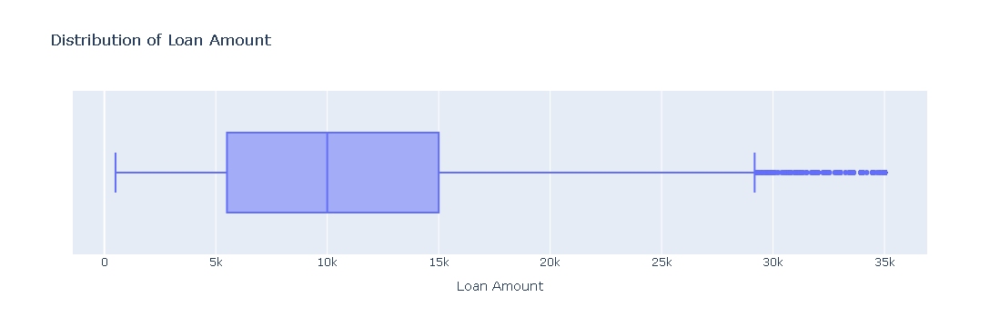

In [138]:
# Loan Amount
print(df1.loan_amnt.describe())
#Plotting histogram of loan amount
px.box(df1,x='loan_amnt',width=750,height=350,title='Distribution of Loan Amount',labels={'loan_amnt':'Loan Amount'}).show()

term
36    73.241498
60    26.758502
Name: count, dtype: float64


AttributeError: 'numpy.int32' object has no attribute 'startswith'

<Figure size 1000x500 with 0 Axes>

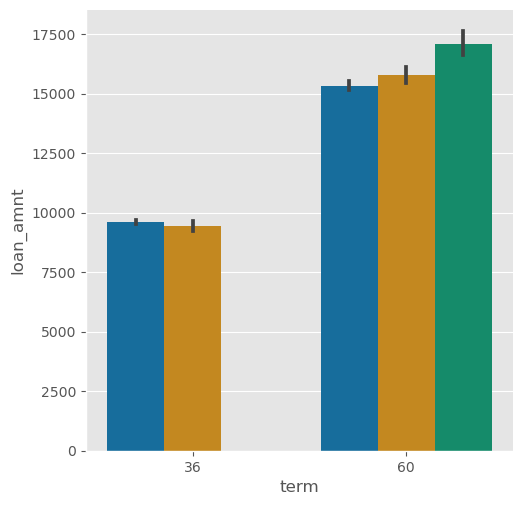

In [163]:
# Term of loan 
print(df1.term.value_counts()*100/df1.term.count())
# 0=Fully Paid, 1=Charged Off
plt.figure(figsize=(10,5))
#ax=sns.countplot(df1.term)
sns.catplot(x ='term', y='loan_amnt', data=df1 ,hue='loan_status', kind='bar')
#ax.set_title('Count of loan taken for given Term')
#ax.set_xlabel('Term duration in months')
#ax.set_ylabel('Count')
plt.show()

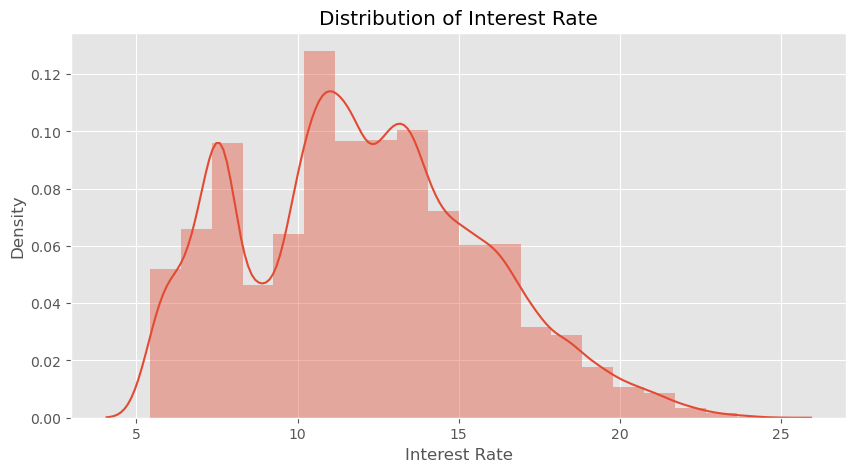

In [145]:
# Distribution of interest rate
plt.figure(figsize=(10,5))
sns.distplot(sorted(df1.int_rate),kde=True,bins=20)
plt.xlabel('Interest Rate')
plt.ylabel('Density')
plt.title('Distribution of Interest Rate')
plt.show()

In [147]:
df.to_csv('loanV3df1.csv', index=False)

AttributeError: 'numpy.int32' object has no attribute 'startswith'

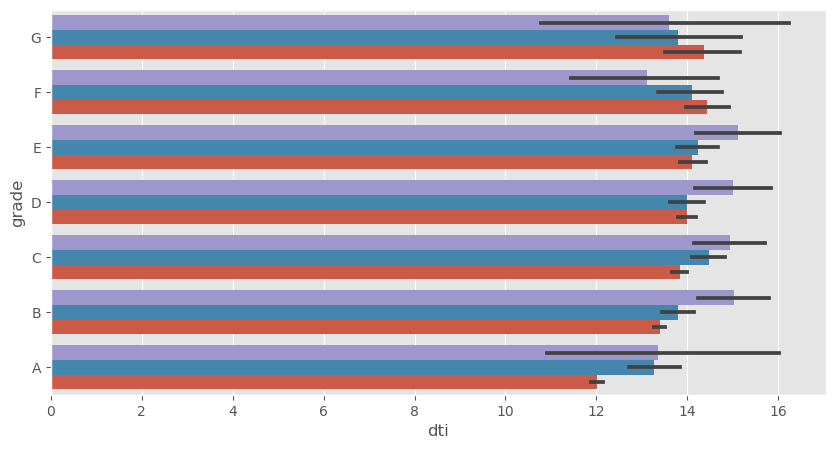

In [149]:
# Comparison of DTI over grade for loan status
plt.figure(figsize=(10,5))
sns.barplot(data=df1,x='dti',y='grade',hue='loan_status')
plt.xlabel('DTI')
plt.ylabel('Grade')
plt.title('Comparison of DTI Based On Grade For Loan Status',fontsize=12)
plt.show()

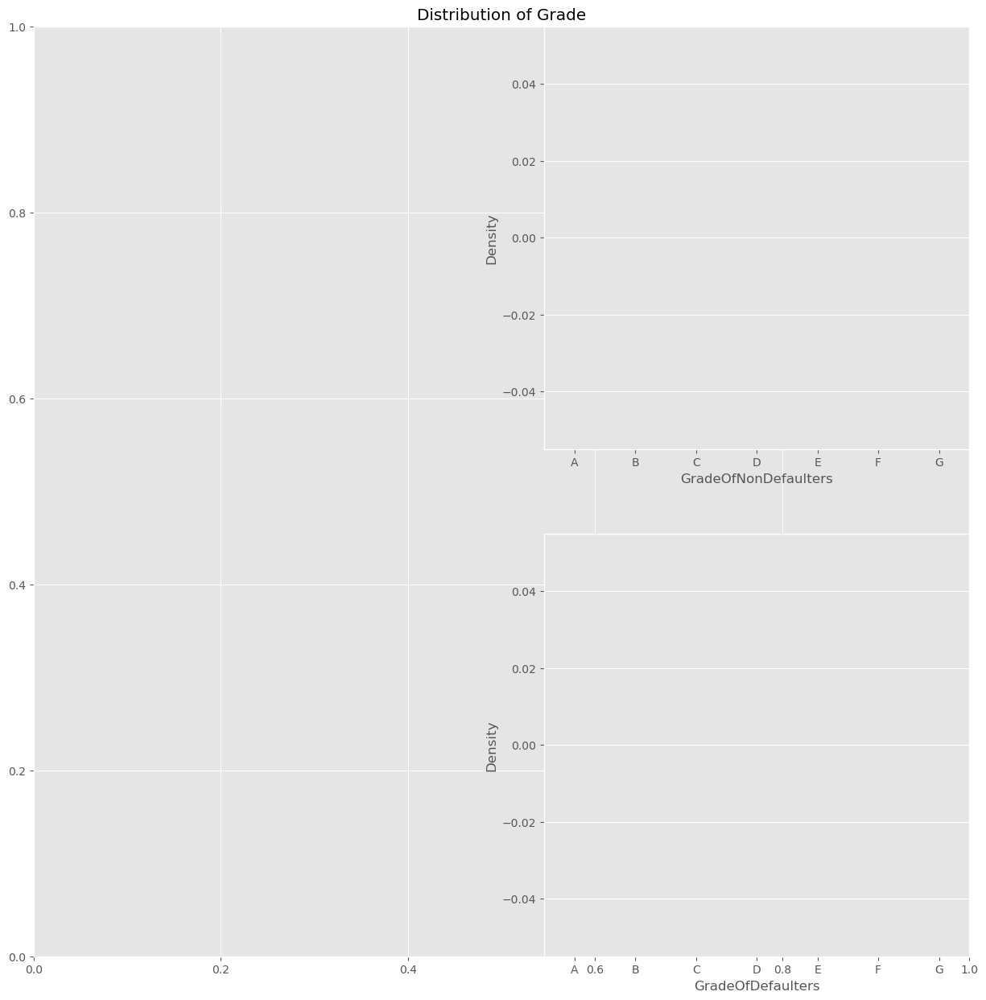

In [151]:
# Distribution of Grade
plt.figure(figsize = (15,15))
plt.title('Distribution of Grade')
plt.subplot(222)
sns.countplot(x='grade', data=df1[df1.loan_status=='Fully Paid'], order=['A', 'B', 'C', 'D', 'E', 'F', 'G'])
plt.xlabel('GradeOfNonDefaulters')
plt.ylabel('Density')
plt.subplot(224)
sns.countplot(x='grade', data=df1[df1.loan_status=='Charged Off'],order=['A', 'B', 'C', 'D', 'E', 'F', 'G'])
plt.xlabel('GradeOfDefaulters')
plt.ylabel('Density')
plt.show()

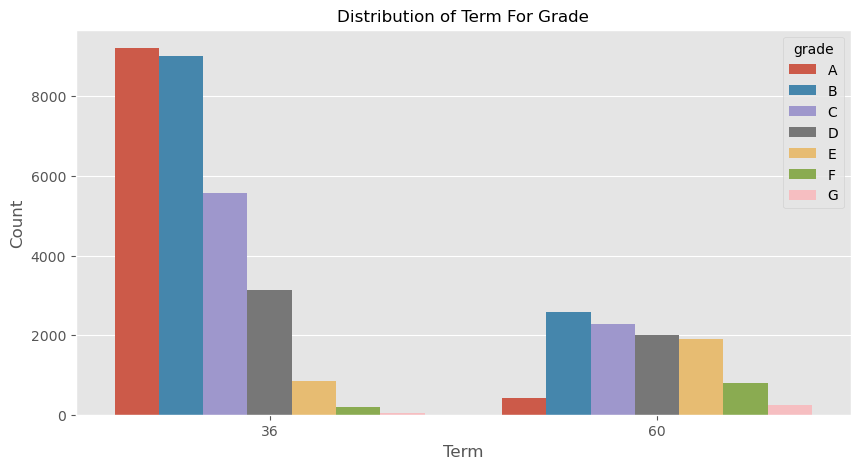

In [153]:
# Distribution of Term based on Grade
plt.figure(figsize=(10,5))
sns.countplot(data=df1,x='term',hue='grade')
plt.xlabel('Term')
plt.ylabel('Count')
plt.title('Distribution of Term For Grade',fontsize=12)
plt.show()

**Observation:** The loans in 36 month term majorily consist of grade A and B loans whereas the loans in 60 month term mostly consist of grade B, C and D loans.

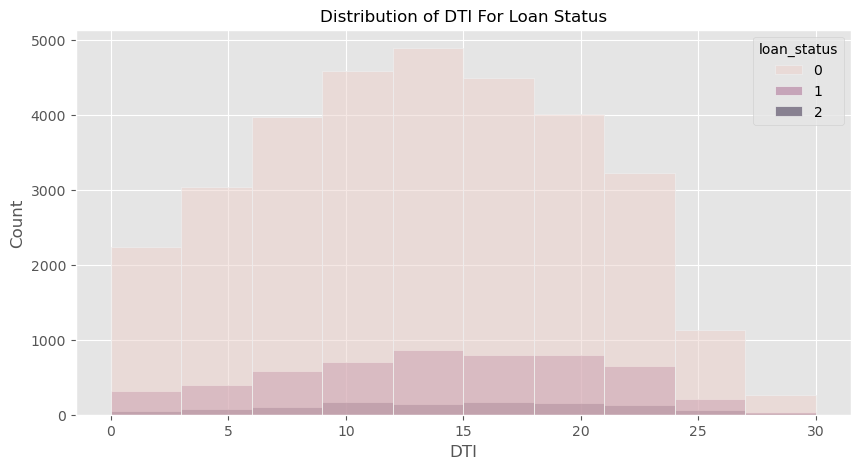

In [155]:
# Distribution of DTI based on Grade
plt.figure(figsize=(10,5))
sns.histplot(data=df1,x='dti',hue='loan_status',bins=10)
plt.xlabel('DTI')
plt.ylabel('Count')
plt.title('Distribution of DTI For Loan Status',fontsize=12)
plt.show()

**Observation:** The Loan Status varies with DTI ratio, we can see that the loans in DTI ratio 10-15 have higher number of defaulted loan but higher dti has higher chance of defaulting.

<Axes: xlabel='grade', ylabel='count'>

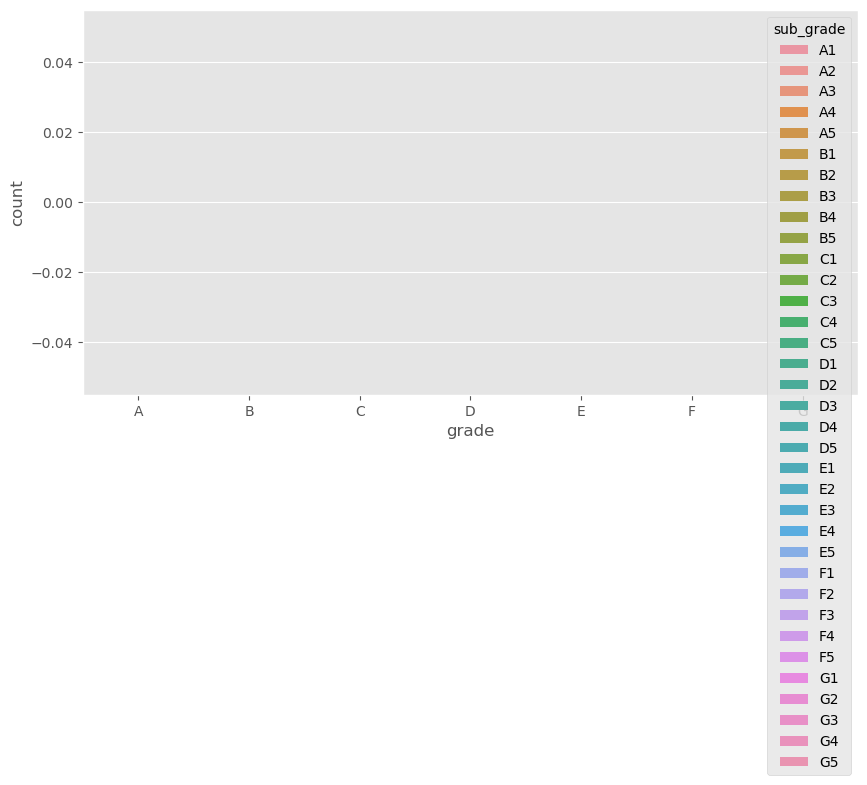

In [157]:
fig, ax = plt.subplots(figsize=(10,5))
sns.set_palette('colorblind')
sns.countplot(x = 'grade', order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'] , hue='sub_grade',data = df1[df1.loan_status == 'Charged Off'])

ValueError: min() arg is an empty sequence

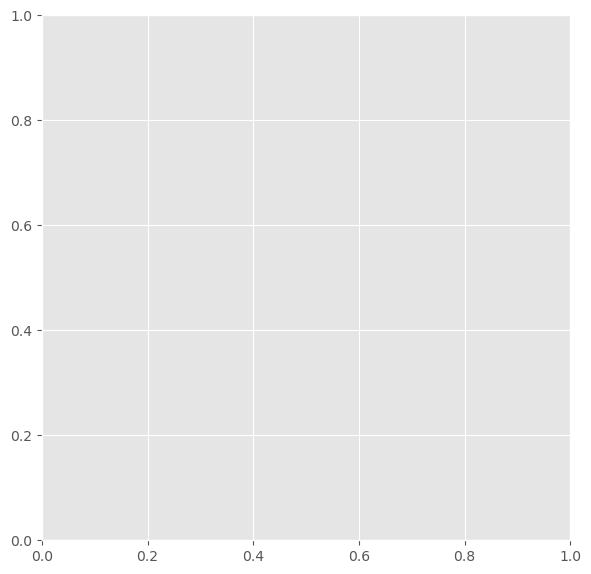

In [165]:
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.countplot(x='issue_month', data=df1[df1['loan_status']=='Charged Off'])
plt.subplot(222)
sns.countplot(x='issue_year', data=df1[df1['loan_status']=='Charged Off'])


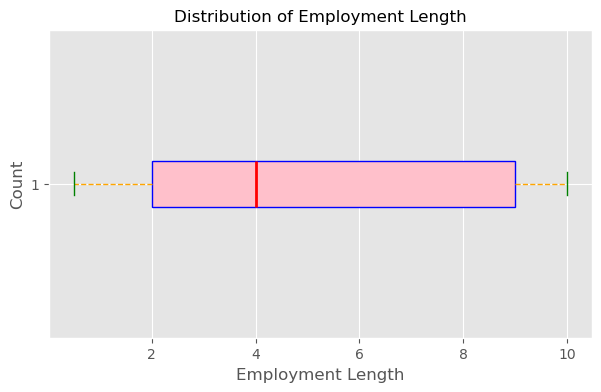

In [167]:
# Distribution of emp_length
plt.figure(figsize=(7,4))
#sns.countplot(df1.emp_length)
plt.boxplot(df1.emp_length, vert=False, patch_artist=True,boxprops=dict(facecolor='pink', color='blue'),whiskerprops=dict(color='orange', linestyle='--'),
            capprops=dict(color='green'),medianprops=dict(color='red', linewidth=2))
plt.xlabel('Employment Length')
plt.ylabel('Count')
plt.title('Distribution of Employment Length',fontsize=12)
plt.show()

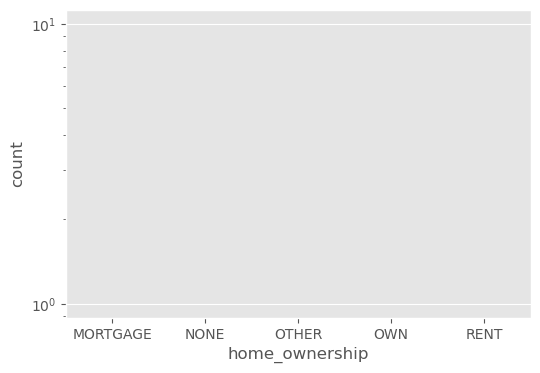

count     38257
unique        5
top        RENT
freq      18406
Name: home_ownership, dtype: object


In [169]:
fig, ax = plt.subplots(figsize = (6,4))
ax.set(yscale = 'log')
sns.countplot(x='home_ownership', data=df1[df1['loan_status']=='Charged Off'])
plt.show()
df1.home_ownership.value_counts()
print(df1.home_ownership.describe())

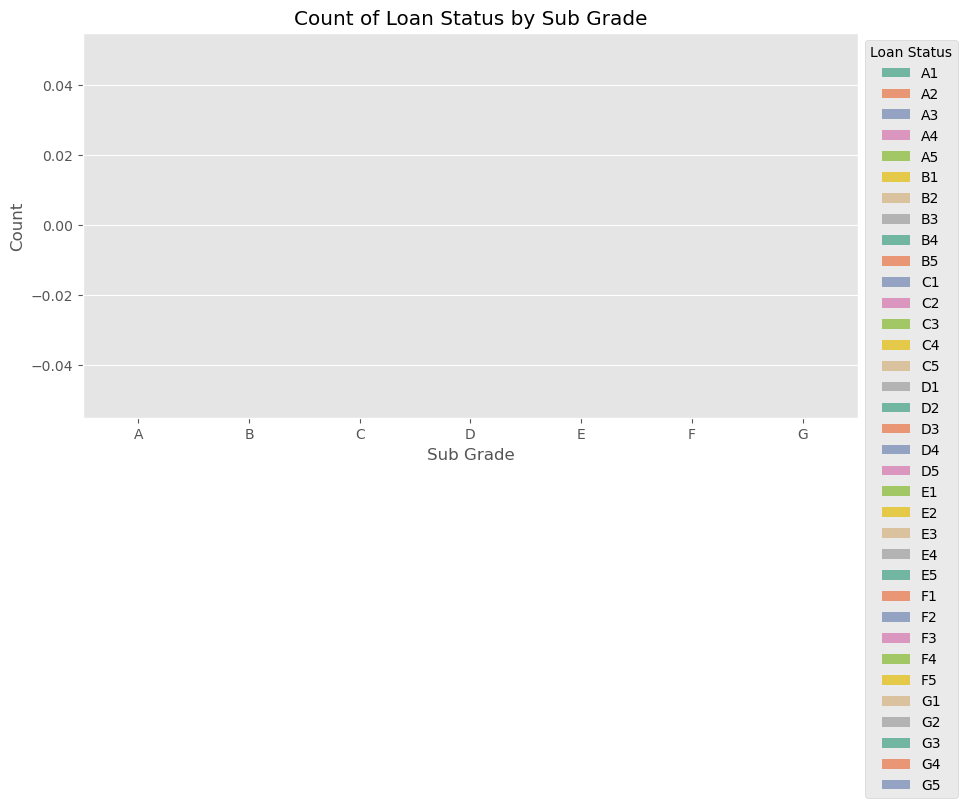

In [289]:
#fig, ax = plt.subplots(figsize=(20,6))
#sns.set_palette('colorblind')
#sns.countplot(x = 'grade', order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'] , hue = 'sub_grade',data = df1[df1.loan_status == 'Charged Off'])
#sns.countplot(x = 'grade', order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'] ,data = df1[df1.loan_status == 'Charged Off'])
plt.figure(figsize=(10, 5))
sns.countplot(x = 'grade', order = ['A', 'B', 'C', 'D', 'E', 'F', 'G'] , hue = 'sub_grade',data = df1[df1.loan_status == 'Charged Off'], palette='Set2')
#sns.countplot(data=df, x='home_ownership', hue='loan_status', palette='Set2')
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1))  # Move legend outside
plt.xlabel('Sub Grade')
plt.ylabel('Count')
plt.title('Count of Loan Status by Sub Grade')
plt.show()

In [171]:
df1.describe()

,id,loan_amnt,term,int_rate,emp_length,annual_inc,loan_status,dti,pub_rec_bankruptcies,issue_year,issue_month
count,3.825700e+04,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000,38257.000000
mean,6.810394e+05,11206.245262,42.422040,12.038083,5.023329,66148.554153,0.196774,13.386252,0.041117,2010.318425,7.169198
std,2.113108e+05,7381.905084,10.624938,3.709023,3.479658,35280.271047,0.463389,6.651121,0.199482,0.884200,3.398848
min,5.473400e+04,500.000000,36.000000,5.420000,0.500000,4000.000000,0.000000,0.000000,0.000000,2007.000000,1.000000
25%,5.136400e+05,5500.000000,36.000000,9.320000,2.000000,41000.000000,0.000000,8.290000,0.000000,2010.000000,4.000000
50%,6.627700e+05,10000.000000,36.000000,11.860000,4.000000,59600.000000,0.000000,13.490000,0.000000,2011.000000,7.000000
75%,8.363030e+05,15000.000000,60.000000,14.590000,9.000000,82000.000000,0.000000,18.630000,0.000000,2011.000000,10.000000
max,1.077501e+06,35000.000000,60.000000,24.590000,10.000000,235000.000000,2.000000,29.990000,2.000000,2011.000000,12.000000


AttributeError: 'numpy.int32' object has no attribute 'startswith'

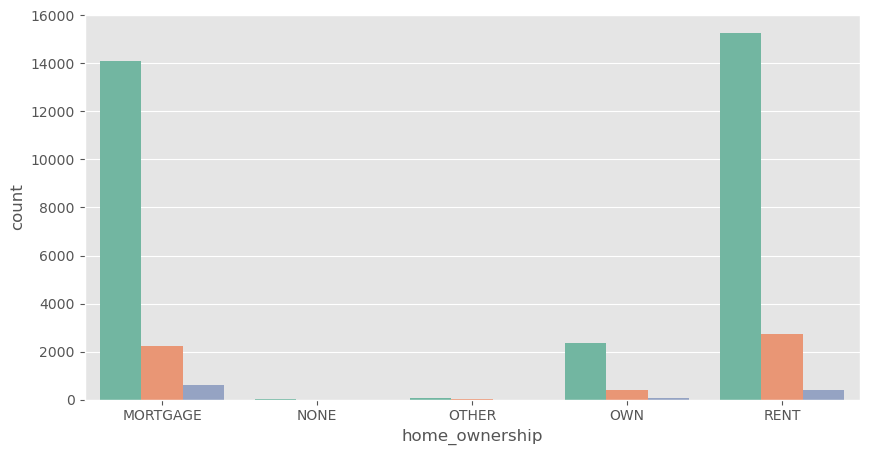

In [175]:
# Distribution of house_ownership based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=df1,x='home_ownership',hue='loan_status', palette='Set2')
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1))
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Distribution of Home Ownership For Loan Status',fontsize=12)
plt.legend(loc='upper center')
plt.show()

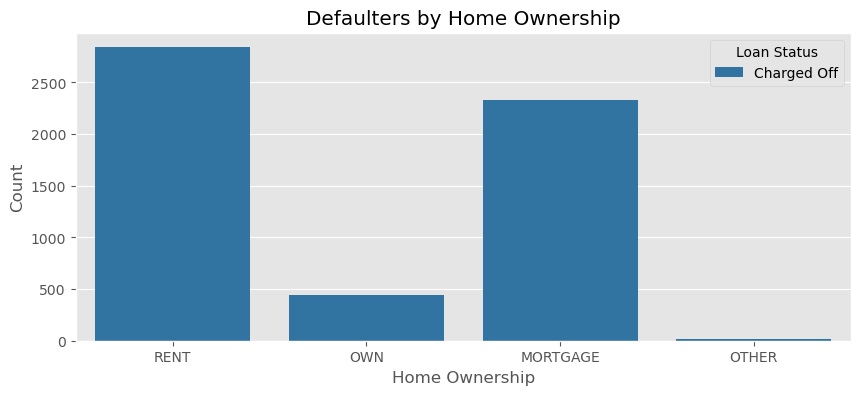

In [177]:
plt.figure(figsize=(10, 4))
#sns.countplot(data=df, x='home_ownership', hue='loan_status', palette='Set2')
#sns.countplot(data=df[df['loan_status'] == 'Charged Off'], x='home_ownership', hue='loan_status', palette='Set2')
color_dict = {
    'Fully Paid': '#1f77b4',
    'Charged Off': '#1f77b4',
    'Default': '#2ca02c'
}

sns.countplot(data=df[df['loan_status'] == 'Charged Off'], x='home_ownership', hue='loan_status', palette=color_dict)
#df[df['loan_status'] == 'Charged Off']
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1))  # Move legend outside
plt.xlabel('Home Ownership')
plt.ylabel('Count')
plt.title('Defaulters by Home Ownership')
plt.show()

Observation: Borrowers with Rent or Mortage have defaulted in huge proportion compared to OWN Home

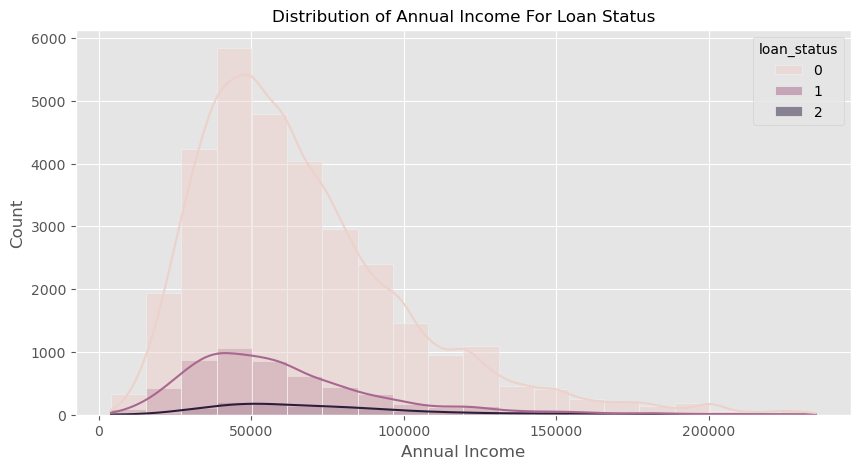

In [179]:
# Distribution of annual_inc based on loan_status
plt.figure(figsize=(10,5))
sns.histplot(data=df1,x='annual_inc',hue='loan_status',bins=20,kde=True)
plt.xlabel('Annual Income')
plt.ylabel('Count')
plt.title('Distribution of Annual Income For Loan Status',fontsize=12)
plt.show()

Observation: Lot of defaulters have less than 50000 annual income

AttributeError: 'numpy.int32' object has no attribute 'startswith'

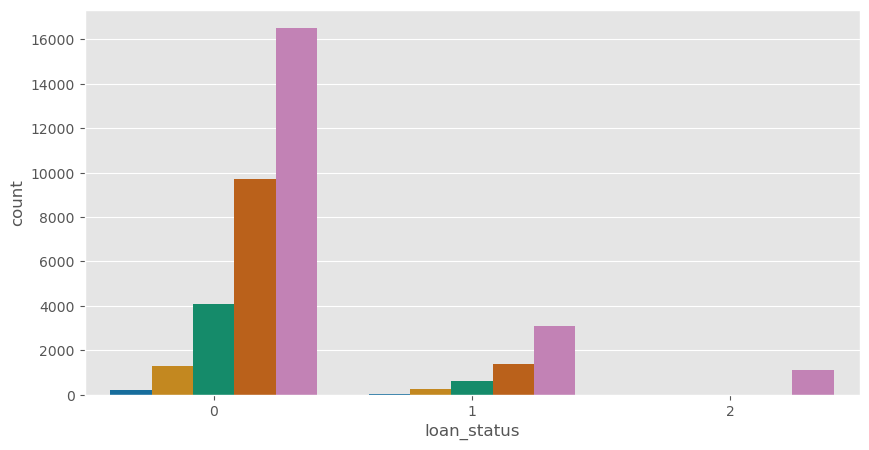

In [181]:
# Distribution of loan_status based on issue_year
plt.figure(figsize=(10,5))
sns.countplot(data=df1,x='loan_status',hue='issue_year')
plt.xlabel('Loans Status')
plt.ylabel('Count')
plt.title('Distribution of Loan Status For Issue Year',fontsize=12)
plt.show()

Observation : Defaulters and Non Defaulters are more in 10+ years, but Fully Paid are exponentially higher than Defaulters 

AttributeError: 'numpy.int32' object has no attribute 'startswith'

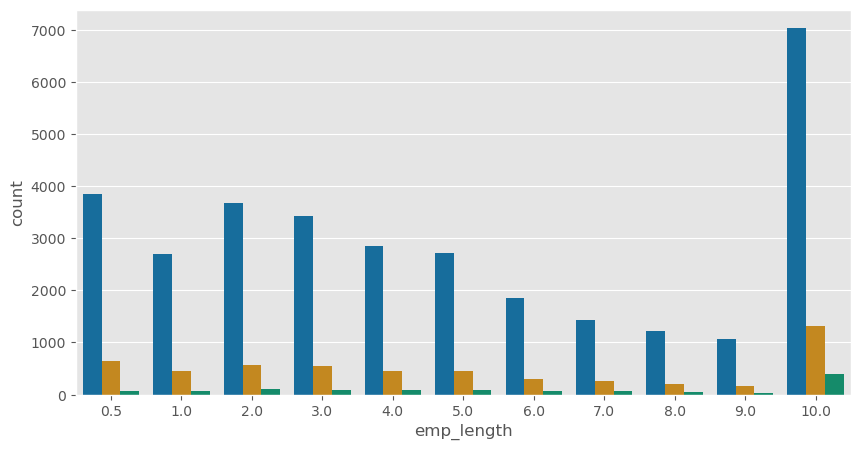

In [183]:
# Distribution of emp_length based on loan_status
plt.figure(figsize=(10,5))
sns.countplot(data=df1,x='emp_length',hue='loan_status')
plt.xlabel('Employment Length in years')
plt.ylabel('Count')
plt.title('Distribution of Employment Length For Loan Status',fontsize=12)
plt.show()

Observation : Defaulters and Non Defaulters are more in 10+ years, but 10+ years have highest chance of paying back

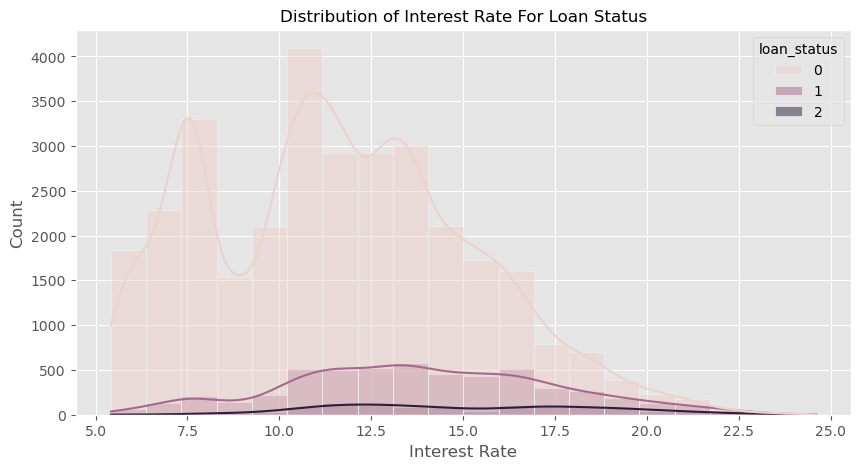

In [185]:
# Distribution of int_amnt based on loan_status
plt.figure(figsize=(10,5))
sns.histplot(data=df1,x='int_rate',hue='loan_status', bins=20, kde=True)
plt.xlabel('Interest Rate')
plt.ylabel('Count')
plt.title('Distribution of Interest Rate For Loan Status',fontsize=12)
plt.show()

In [ ]:
Observation : Defaulters increase with interest rate but there is downtrend after 17% interest rates

Bivariate Analysis

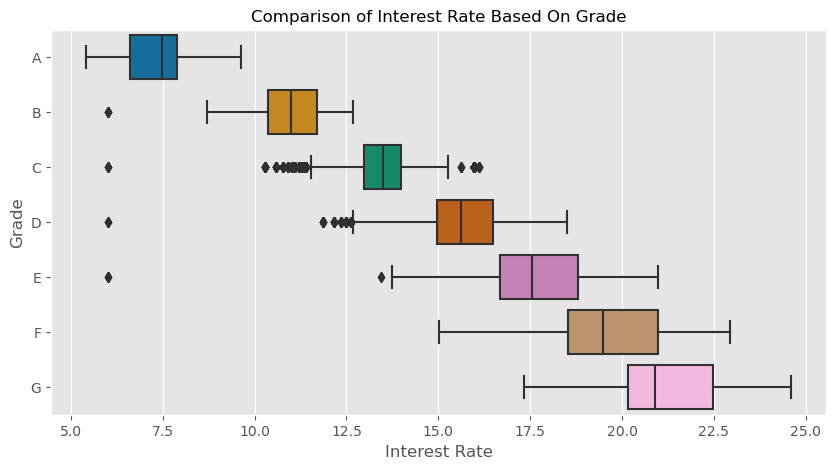

In [187]:
# Comparison of interest rate based on grade
plt.figure(figsize=(10,5))
sns.boxplot(data=df1,x='int_rate',y='grade')
plt.xlabel('Interest Rate')
plt.ylabel('Grade')
plt.title('Comparison of Interest Rate Based On Grade',fontsize=12)
plt.show()

Observation: The brrowers interest has increased with lower grades , higher the grade  lower the interest rate.

<Figure size 1000x500 with 0 Axes>

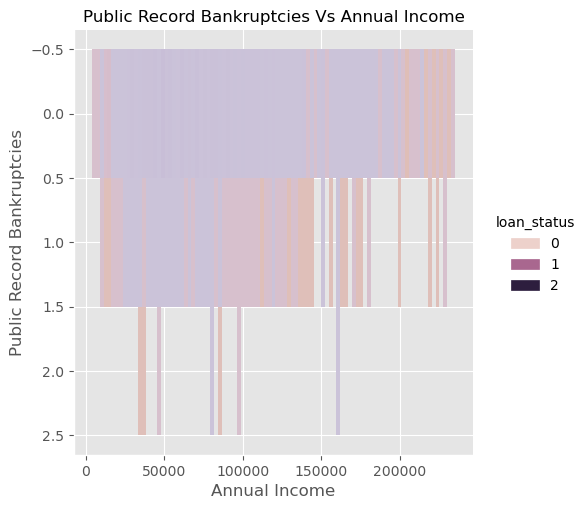

In [201]:
# Comparison of annual income to public record bankruptcy over loan status
plt.figure(figsize=(10,5))
sns.displot(y=df1.pub_rec_bankruptcies.astype('category'),x=df1.annual_inc,hue=df1.loan_status)
plt.xlabel('Annual Income')
plt.ylabel('Public Record Bankruptcies')
plt.title('Public Record Bankruptcies Vs Annual Income',fontsize=12)
plt.show()

**Observation:** The brrowers are mostly having no record of Public Recorded Bankruptcy and are safe choice for loan issue.

In [197]:
# Heatmap of correlation between variables
plt.figure(figsize=(10,10))
sns.heatmap(df1.corr(),annot=True)
plt.show()

ValueError: could not convert string to float: 'B'

<Figure size 1000x1000 with 0 Axes>